# Extension to Complex Plane using Non-Orthogonal Radiation Modes

Propagation notebook shows integral coefficient system is set up right; here we use non-orthogonal radiation modes and see what their extension to the complex plane looks like.  More specificially, there is a denominator in the integral that is f0 independent, here we examine its zeros.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from slab import SlabExact
from scipy.linalg import eig
from fiberamp.fiber.microstruct.bragg import plotlogf, plotlogf_real
from scipy.integrate import quad
from scipy.optimize import newton

%matplotlib widget

In [2]:
A = SlabExact(ns=[1.4, 1.5, 1.4], ts=[1e-6, 1e-6, 1e-6], wl=.9e-6, symmetric=True) 

# A = SlabExact(ns=[1.44, 1.45, 1.46, 1.44], ts=[2e-6, 2e-6, 2e-6, 2e-6], xrefs=[100,100,100,100],symmetric=True)

### Non-Orthogonal

In [3]:
S = np.array([[0, 1], [1, 0]])

def fp(Z):
    M = A.transmission_matrix_Z(Z)
    c = np.sqrt(M[...,1,1]/ -1 + M...,1,0], dtype=complex)
    return np.array([c, c.conj()])

def fm(Z):
    M = A.transmission_matrix_Z(Z)
    c = np.sqrt(M[...,1,1]/ -1 - M...,1,0], dtype=complex)
    return np.array([c, c.conj()])
    
def det(Z, v1=np.array([1/2, 1/2]), v2=np.array([.5*1j, -.5*1j])):
    
    Ca = A.coefficients_Z(Z, c0=v1[0], c1=v1[1], mode_type='radiation').T
    Cb = A.coefficients_Z(Z, c0=v2[0], c1=v2[1], mode_type='radiation').T

    Naa = (Ca[0].T @ S @ Ca[0] + Ca[-1].T @ S @ Ca[-1])
    Nbb = (Cb[0].T @ S @ Cb[0] + Cb[-1].T @ S @ Cb[-1])
    Nab = (Ca[0].T @ S @ Cb[0] + Ca[-1].T @ S @ Cb[-1])
    
    return Naa * Nbb - Nab**2

def detvar(Z):
    v1, v2 =fp(Z), fm(Z)
    Ca = A.coefficients_Z(Z, c0=v1[0], c1=v1[1], mode_type='radiation').T
    Cb = A.coefficients_Z(Z, c0=v2[0], c1=v2[1], mode_type='radiation').T

    Naa = (Ca[0].T @ S @ Ca[0] + Ca[-1].T @ S @ Ca[-1])
    Nbb = (Cb[0].T @ S @ Cb[0] + Cb[-1].T @ S @ Cb[-1])
    Nab = (Ca[0].T @ S @ Cb[0] + Ca[-1].T @ S @ Cb[-1])
    
    return Naa * Nbb - Nab**2
    
def M_Z(Z):
    M = A.transmission_matrix_Z(Z)
    return M[..., 0,0] * M[..., 1,1]

def M00_Z(Z):
    M = A.transmission_matrix(Z, Z_plane=True, Ztype_far_left='standard', Ztype_far_right='standard')
    return M[..., 0,0]

def M11_Z(Z):
    M = A.transmission_matrix(Z, Z_plane=True, Ztype_far_left='standard', Ztype_far_right='standard')
    return M[..., 1,1]

def term1(Z, v1=np.array([1/2, 1/2])):
    Ca = A.coefficients_Z(Z, c0=v1[0], c1=v1[1], mode_type='radiation').T
    return (Ca[0].T @ S @ Ca[0] + Ca[-1].T @ S @ Ca[-1])**2

def term2(Z, v1=np.array([.5*1j, -.5*1j])):
    Ca = A.coefficients_Z(Z, c0=v1[0], c1=v1[1],  mode_type='radiation').T
    return (Ca[0].T @ S @ Ca[0] + Ca[-1].T @ S @ Ca[-1])**2


ratio = lambda z: M_Z(z) / det(z)

Product of M00 and M11

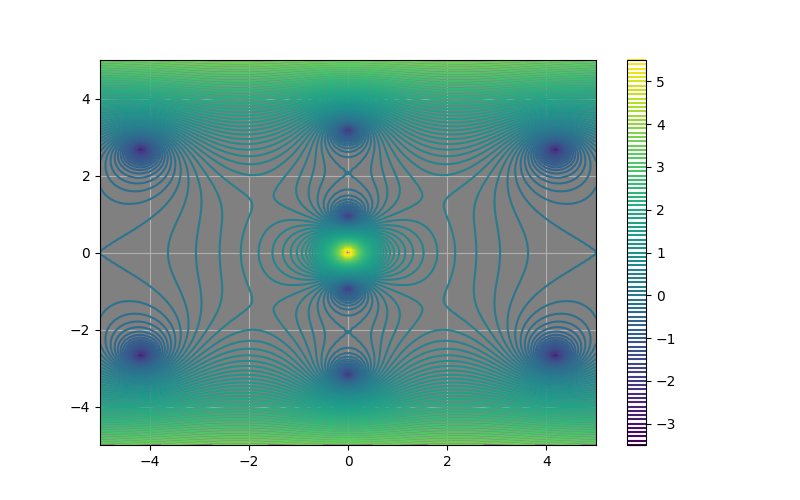

In [4]:
plt.close('all')
plotlogf(M_Z, -5, 5, -5, 5,  figsize=(8,5), iref=100, rref=100, levels=100)

Plot of det N for constant left vector modes

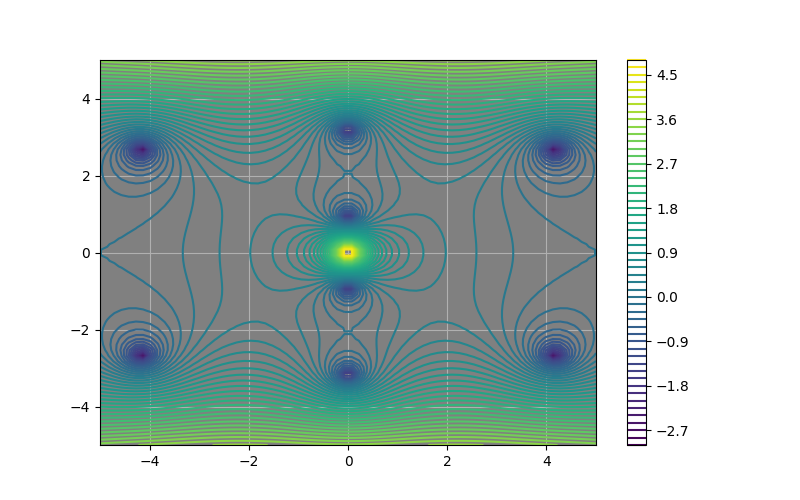

In [5]:
plotlogf(det, -5, 5, -5, 5,  figsize=(8,5), loop=True, iref=70, rref=70, levels=70)

They have the same zeros

In [6]:
newton(det, np.array([4+3j])), newton(M_Z, np.array([4+3j]))

(array([4.16929564+2.67520751j]), array([4.16929564+2.67520751j]))

The determinant has a factor of M11 * M22 in it apparently.  But even further, it looks like it might be a constant multiple of it.

In [7]:
frac = lambda z: det(z)/M_Z(z)

In [8]:
frac(-2+1j), frac(4j), frac(3), frac(1-1j)

((1.0000000000004066-1.511617001312745e-13j),
 (0.9999999999997096-0j),
 (0.9999999999993102-4.485361458889612e-17j),
 (0.999999999999777-2.611854139110682e-13j))

Examining the ratio of the two

In [9]:
ratio(1j), ratio (1+10j)

((1.0000000000174425+1.923379688489406e-17j),
 (0.9999961341092986+3.2429705448020813e-06j))

Plotting the ratio

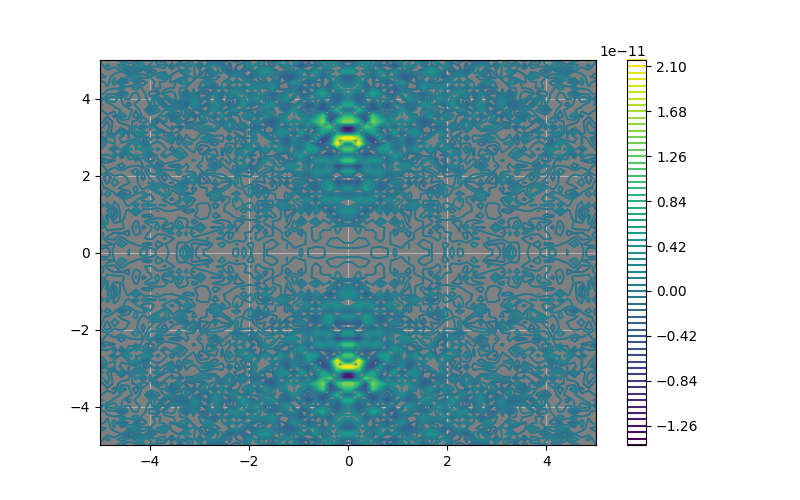

In [12]:
plotlogf(ratio, -5, 5, -5, 5,  figsize=(8,5), loop=True, iref=70, rref=70, levels=70)

Um, it looks like det N is exactly a multiple of M00*M11.  This depends on v1 and v2, notably only their real part.

Seems like it's det = 4 * sum of squared real parts of v1 * sum of squared imaginary parts of v2 * M11 * M22

This is a bit strange, because for the orthogonal version of things we got that the det function above was exactly equal to 
-4 *M11 * M22 * (v1.T @ (S + M.T @ S @ M) @ v1)**2.

So is that latter term constant?

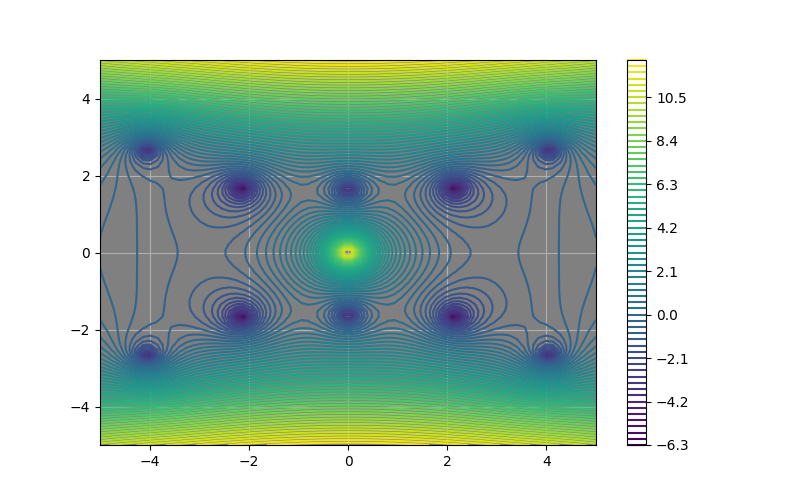

In [11]:
plt.close('all')
plotlogf(term1, -5, 5, -5, 5,  figsize=(8,5), loop=True, iref=70, rref=70, levels=70)

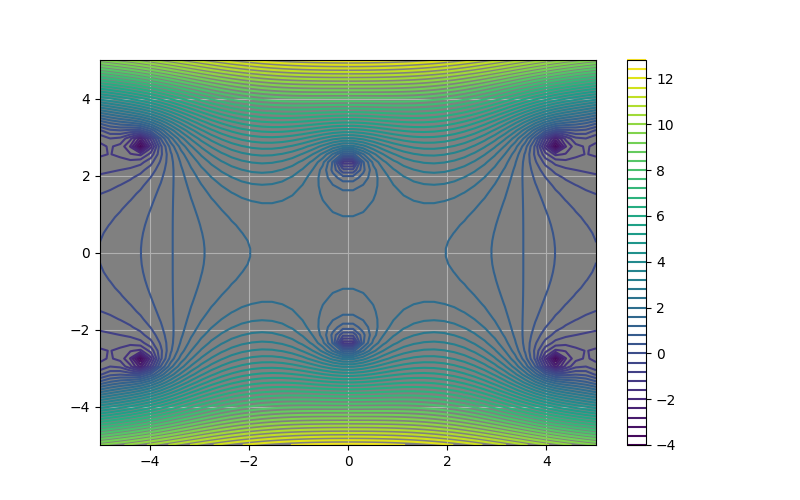

In [13]:
plotlogf(term2, -5, 5, -5, 5,  figsize=(8,5), loop=True, iref=50, rref=50, levels=50)

No, it's definitely not constant.  Let's look at the results when we use the paper method

# Orthogonal Version

Using method from paper

In [14]:
S = np.array([[0, 1], [1, 0]])

def det_orthog(Z):
    Ca = A.coefficients_Z(Z, mode_type='radiation', sign='1').T
    Cb = A.coefficients_Z(Z, mode_type='radiation', sign='-1').T

    Naa = (Ca[0].T @ S @ Ca[0] + Ca[-1].T @ S @ Ca[-1])
    Nbb = (Cb[0].T @ S @ Cb[0] + Cb[-1].T @ S @ Cb[-1])
    Nab = (Ca[0].T @ S @ Cb[0] + Ca[-1].T @ S @ Cb[-1])
    return (Naa*Nbb - Nab**2)**.5

def term_orthog(Z, sign='1'):
    Ca = A.coefficients_Z(Z, mode_type='radiation', sign=sign).T
    Naa = (Ca[0].T @ S @ Ca[0] + Ca[-1].T @ S @ Ca[-1])
    return Naa**2

def coeffs_vs(Z):
    C = A.coefficients_Z(Z, mode_type='radiation', sign='1')
    Cb = A.coefficients_Z(Z, mode_type='radiation', sign='-1').T

    v, w = C.T[0], C.T[-1]
    vb, wb = Cb.T[0], Cb.T[-1]
    return v[0] * vb[0]

def coeffs_ws(Z):
    C = A.coefficients_Z(Z, mode_type='radiation', sign='1')
    Cb = A.coefficients_Z(Z, mode_type='radiation', sign='-1').T

    v, w = C.T[0], C.T[-1]
    vb, wb = Cb.T[0], Cb.T[-1]
    return w[0] * wb[0]

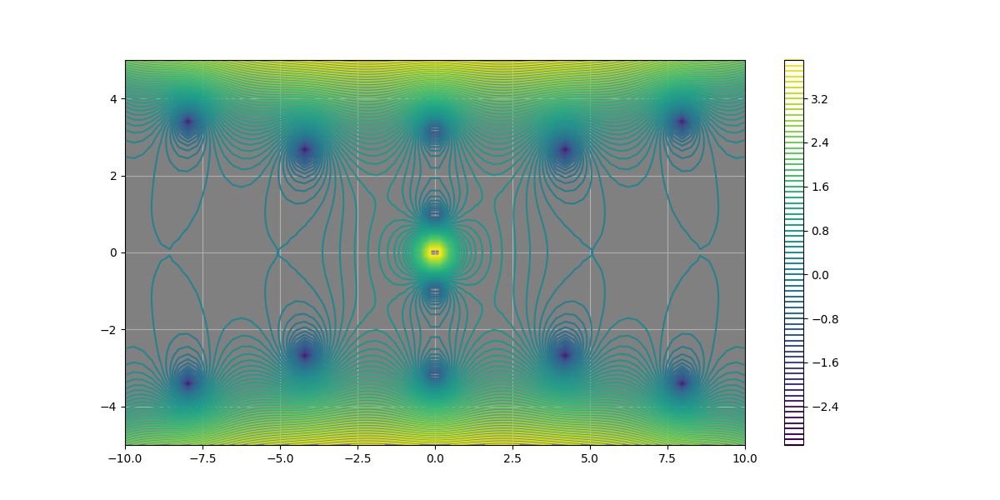

In [15]:
plotlogf(M_Z,  -10, 10, -5, 5,  figsize=(12,6), iref=70, rref=70, levels=70)

In [16]:
root = newton(M_Z, np.array([3.8 + 2.2j]))

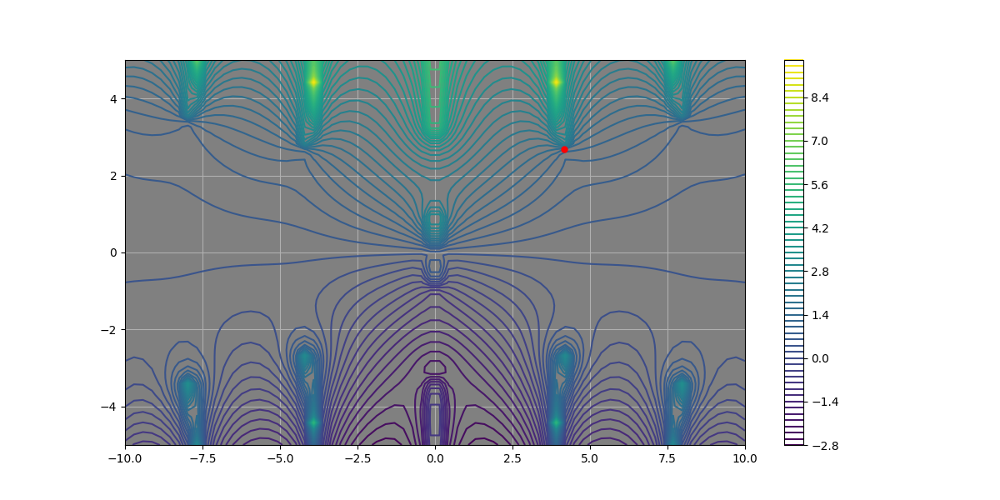

In [17]:
plt.close('all')
plotlogf(det_orthog,  -10, 10, -5, 5,  figsize=(12,6), iref=70, rref=70, levels=70, loop=True)
plt.plot(root.real, root.imag, marker='o', markersize=5, color='r');

Things get totally screwy when we do this for the orthogonal version...  Why is that?

We might need to check if our derivations are correct for Z complex.  See also the Marcuse_3_Layer_Extension notebook.

We note below that this plot does seem to contain the zeros of M_Z:

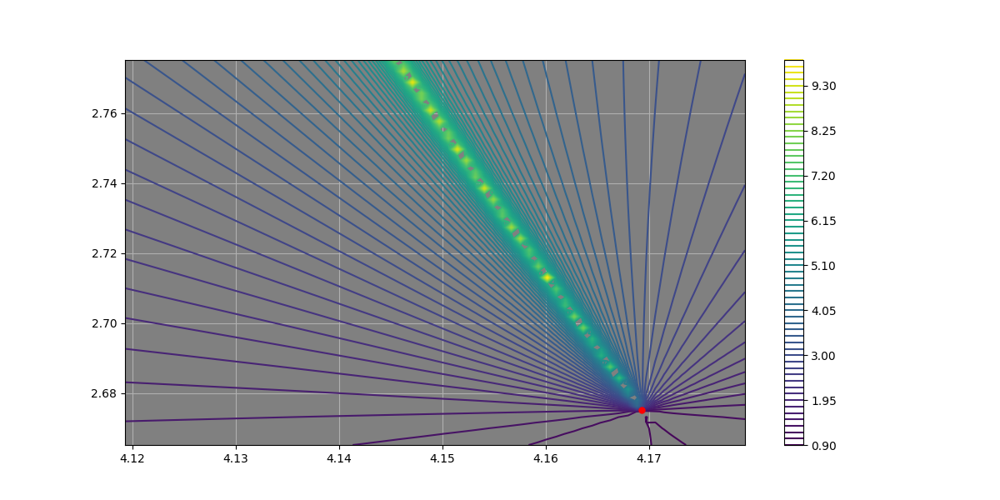

In [18]:
plotlogf(det_orthog,  root.real-.05, root.real+.01, root.imag-.01, root.imag+.1,  figsize=(12,6), iref=70, rref=70, levels=70, loop=True)
plt.plot(root.real, root.imag, marker='o', markersize=5, color='r');

Plotting the coefficients of the paper method

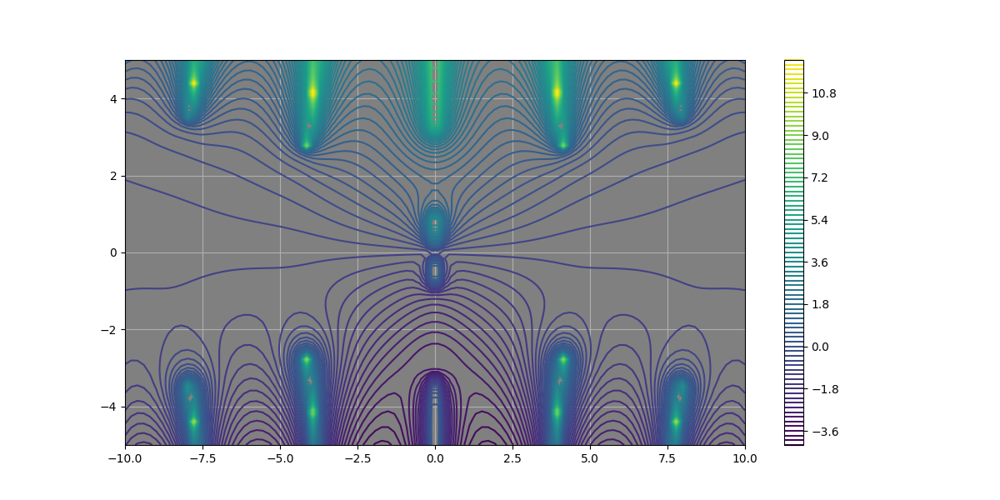

In [19]:
plotlogf(coeffs_vs,  -10, 10, -5, 5,  figsize=(12,6), iref=100, rref=100, levels=100, loop=True)

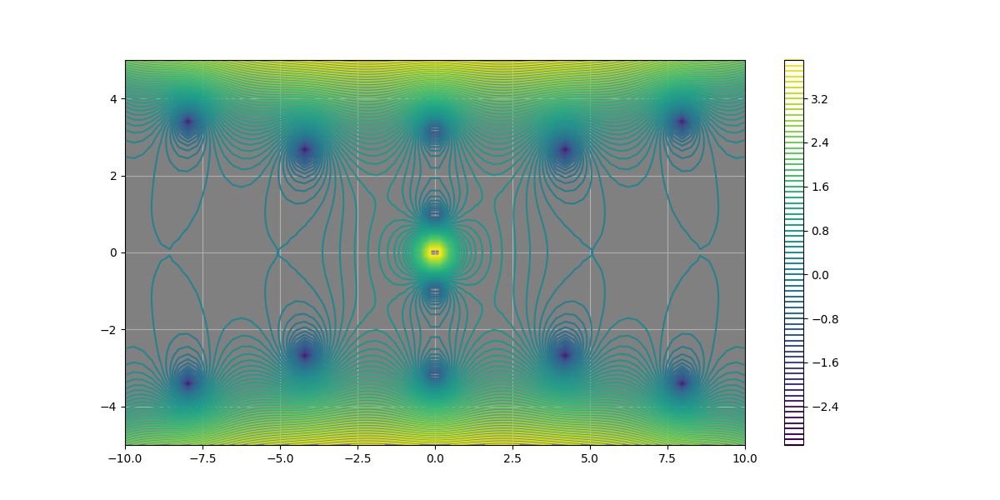

In [20]:
plotlogf(M_Z,  -10, 10, -5, 5,  figsize=(12,6), iref=70, rref=70, levels=70)

The coefficients have the zeros of M00 and M11 built in naturally, but only in v1 and v2, the entries of v1 and v2 are not actually swapped properly to form w1 and w2 using the paper method.  If we plot those we get:

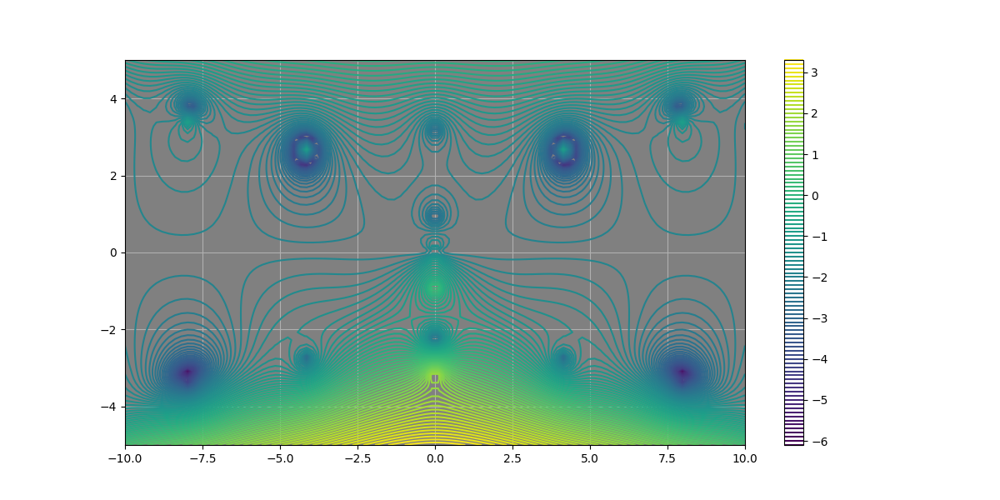

In [62]:
plotlogf(coeffs_ws,  -10, 10, -5, 5,  figsize=(12,6), iref=100, rref=100, levels=100, loop=True)

## Allow for non-constant vectors in non-orthogonal determinant

In [25]:

def fp(Z):
    M = A.transmission_matrix_Z(Z)
    c = np.sqrt(M[...,1,1]/ (-1 + M[...,1,0]), dtype=complex)
    return np.array([c, c.conj()])

def fm(Z):
    M = A.transmission_matrix_Z(Z)
    c = np.sqrt(M[...,1,1]/ (-1 - M[...,1,0]), dtype=complex)
    return np.array([c, c.conj()])

def detvar(Z):
    v1, v2 = fp(Z), fm(Z)
    Ca = A.coefficients_Z(Z, c0=v1[0], c1=v1[1], mode_type='radiation').T
    Cb = A.coefficients_Z(Z, c0=v2[0], c1=v2[1], mode_type='radiation').T

    Naa = (Ca[0].T @ S @ Ca[0] + Ca[-1].T @ S @ Ca[-1])
    Nbb = (Cb[0].T @ S @ Cb[0] + Cb[-1].T @ S @ Cb[-1])
    Nab = (Ca[0].T @ S @ Cb[0] + Ca[-1].T @ S @ Cb[-1])
    
    return Naa * Nbb - Nab**2
    

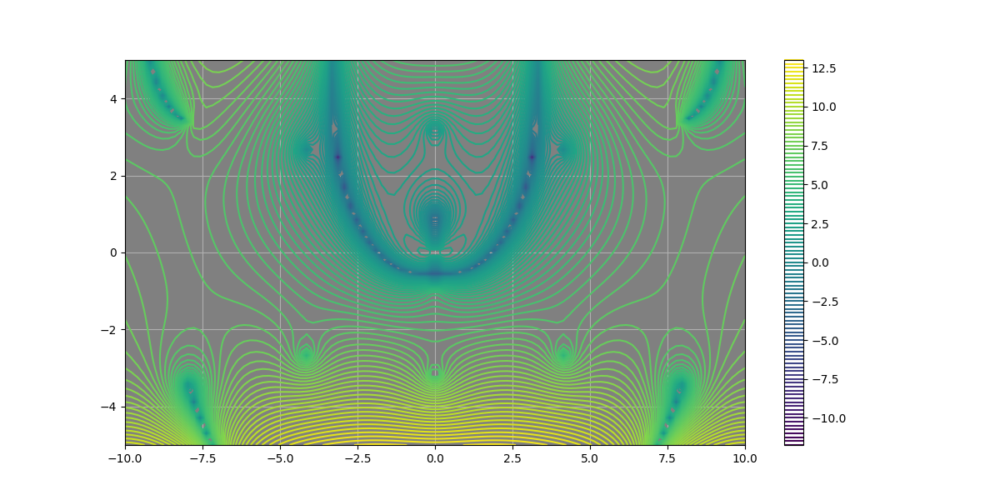

In [26]:
plotlogf(detvar,  -10, 10, -5, 5,  figsize=(12,6), iref=100, rref=100, levels=100, loop=True)

# Real axis

Just for expoloration

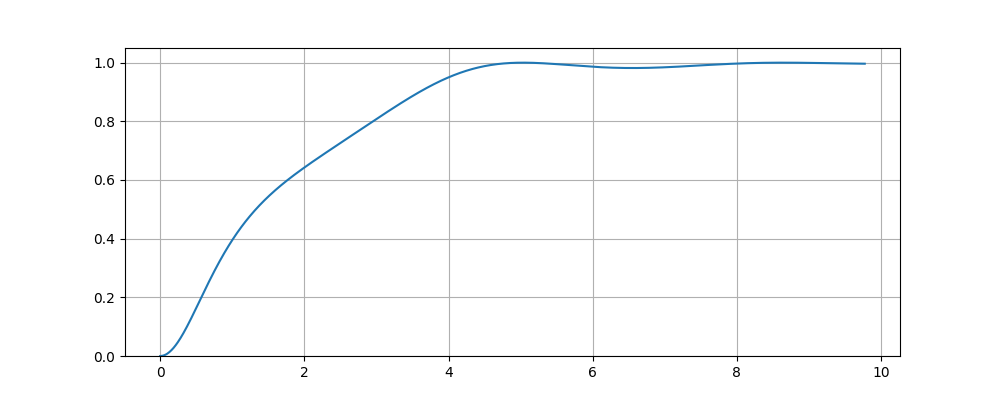

In [39]:
plt.close('all')
plotlogf_real(lambda x: 1/det(x), 0.000001, 1*A.K_low, n=1000,loop=True, log_off=True)
ax = plt.gca()
# ax.set_ylim(0,1)

(0.0, 1.0)

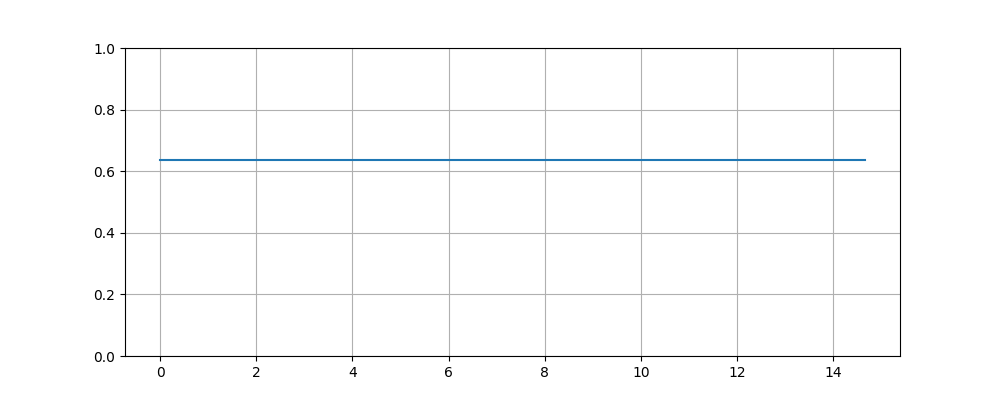

In [41]:
plt.close('all')
plotlogf_real(det_orthog, 0.0001, 1.5*A.K_low, loop=True, log_off=True)
ax = plt.gca()
ax.set_ylim(0,1)